Дипломная работа на курсе МГТУ им. Н. Баумана

Проект по разработке нейронной сети по определению характеристик компазиционных материалов
Версия 2.

Подготовка среды для проекта ENV
При начале работы над проектом необходимо было установить несколько пакетов библиотек Python таких как tensorflow, seaborn и др.
Выяснилось, что невозможно установить пакеты через PIP install, так как win 10 не воспринимат путь к файлу длиннее 260 симвлов. Пришлось написть программу по изменению Политики доступа для win 10 с расширением .bat. Однако это тоже не дало результатов. Пришлось с помощью изменения regedit вносить изменения в ключь Computer\HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Control\FileSystem, что привело к возможности записывать блинные пути к файлу.

Но! Установка tensorflow прошла только для моего окружения  MeEnvJupiterLab!!!!!  
  WARNING: The scripts estimator_ckpt_converter.exe, import_pb_to_tensorboard.exe, saved_model_cli.exe, tensorboard.exe, tf_upgrade_v2.exe, tflite_convert.exe, toco.exe and toco_from_protos.exe are installed in 'C:\Users\grain\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\Scripts' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
Successfully installed tensorflow-2.11.0 tensorflow-intel-2.11.0

Инсталировал еще несколько пакетов
!pip  install  import_ipynb
!pip install ipynb

In [1]:
# Блок № 1 Создание и очистка df от выбросов

# Импортируем в Блок требуемые библиотеки

# Блок основных библиотек
import pandas as pd # библиотека для обработки и анализа данных
import numpy as np
import seaborn as sns # библиотека для создания статистических графиков
import random #  генераторатор случайных чисел и данных
import math

# Библиотека перевода
import googletrans 
from googletrans import Translator 

# Блок модулей и библиотек для построения графиков
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import plotly
from plotly.subplots import make_subplots
%matplotlib inline
sns.set_style('darkgrid')

# Блок библиотек и модулей для статистического и корреляционного анализа
from sklearn. preprocessing import LabelEncoder
import scipy
from scipy import stats # для метода обнаружения Q и IQR,  а также z-корреляции
from scipy.stats import mstats

# Блок библиотек по созданию отчетов  по df
import ydata_profiling  # Модуль статистического отчета. Форма pandas_profiling!!!! отменяется c 1-го апреля 2023 г
from ydata_profiling import ProfileReport
import sweetviz as sv # Модуль статистического отчета sweetviz

# Блок исключеия вывода предупреждающих ошибок
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [66]:
# Блок импорта созданых функций для проекта из папки modules_def
%run ./modules_def/optimize_memory_usage.ipynb # функция оптимизации размера df
%run ./modules_def/drawing_graphs.ipynb        # функция рисования разных графиков 
%run ./modules_def/sns_plt_PairGrid.ipynb      # функция рисования матрицы графиков
%run ./modules_def/translate_list_data.ipynb   # функция перевода списка с русского на англ
%run ./modules_def/mean_round_point.ipynb      # функция расчета среднего значения вокруг подозрительного выброса
%run ./modules_def/outliers_IQR_delit.ipynb    # функция очистки выбросов по методу IQR
%run ./modules_def/Z_score.ipynb               3 функция очистки выбросов методом Z_score

In [3]:
# Загрузим 1-ю часть dataset: композиты МГТУ -X_bp.xlsx
df_bp = pd.read_excel(r'data_storage\data_begin\X_bp.xlsx', index_col = 0)

In [4]:
df_bp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [5]:
# Загрузим 1-ю часть dataset: композиты МГТУ -X_nup.xlsx
df_nup = pd.read_excel(r'data_storage\data_begin\X_nup.xlsx', index_col = 0)

In [6]:
df_nup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [7]:
# Проверим наши 2 исходных df на графиках начальных данных df.head(50)

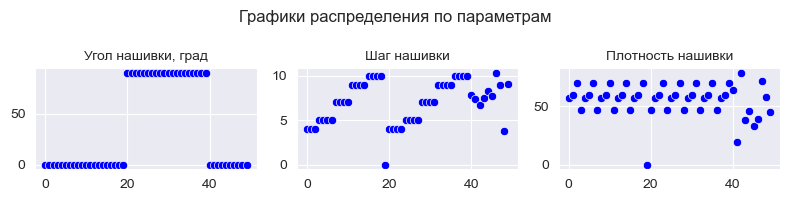

In [7]:
drawing_graphs(df_nup.head(50), 1, 3, 8, 2,  None,'scatterplot','Графики распределения по параметрам',
               graf_name_path = r'save_fig\fig_block1_clean\graf_df_nup_40')

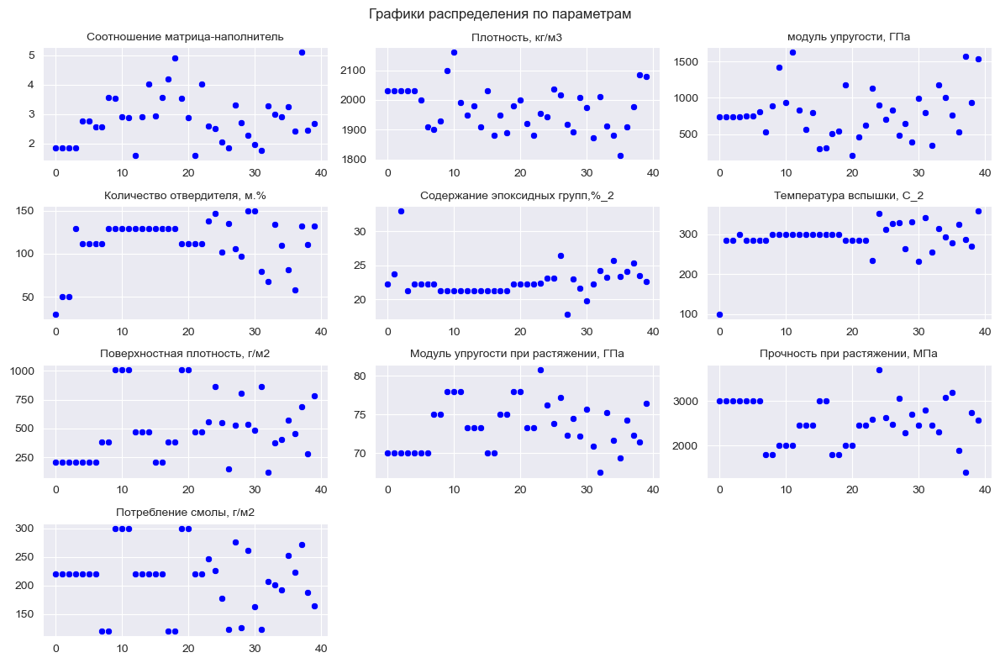

In [8]:
drawing_graphs(df_bp.head(40), 4, 3, 12, 8, None,'scatterplot',
               'Графики распределения по параметрам', 
               graf_name_path = r'save_fig\fig_block1_clean\graf_df_bp_40')

## Гипотеза - в df внесены искусственые искажения.

В df_nup в диапазоне от 0 до 40 строки наблюдается явная детерменированность показателей, что свидетельствует об искусственном искажении DF. 
Удалим первые 40 строк из df_nup как явно искаженные,
отбросив  первые 40 строк: 1040 - 40  = 1000 строк для df_nup.
В df_bp в диапазоне от 0 до  (20-30) строк наблюдается явная детерменированность показателей, что также свидетельствует об искусственном искажении df_bp. 
В df_bp отборсим начальные 23 стоки: 1023 - 23 = 1000. Размерность наших массивов будет соблюдена и составит 1000.
Объединим df_nup.drop и df_bp-drop методом INNER в датафрейм data_main

In [9]:
df_nup_drop = df_nup.drop(labels=range(0, 40), axis=0)

In [10]:
df_nup_drop

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
40,0,7.856167,64.301964
41,0,7.401543,19.250533
42,0,6.675780,78.623299
43,0,7.526398,38.176975
44,0,8.325699,46.045428
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [11]:
df_nup_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 40 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1000 non-null   int64  
 1   Шаг нашивки         1000 non-null   float64
 2   Плотность нашивки   1000 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 31.2 KB


In [12]:
df_bp_drop = df_bp.drop(labels=range(0, 23), axis=0)

In [13]:
df_bp_drop

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556
26,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561
27,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [14]:
df_bp_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 23 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1000 non-null   float64
 1   Плотность, кг/м3                      1000 non-null   float64
 2   модуль упругости, ГПа                 1000 non-null   float64
 3   Количество отвердителя, м.%           1000 non-null   float64
 4   Содержание эпоксидных групп,%_2       1000 non-null   float64
 5   Температура вспышки, С_2              1000 non-null   float64
 6   Поверхностная плотность, г/м2         1000 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1000 non-null   float64
 8   Прочность при растяжении, МПа         1000 non-null   float64
 9   Потребление смолы, г/м2               1000 non-null   float64
dtypes: float64(10)
memory usage: 85.9 KB


In [15]:
# Обнуляем индексы у df_nup_drop, чтобы с координировать индексы с df_bp. Массивы по 1000 строк.

df_nup_drop.reset_index(drop= True , inplace= True )

In [16]:
df_nup_drop

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,7.856167,64.301964
1,0,7.401543,19.250533
2,0,6.675780,78.623299
3,0,7.526398,38.176975
4,0,8.325699,46.045428
...,...,...,...
995,90,8.088111,47.759177
996,90,7.619138,66.931932
997,90,9.800926,72.858286
998,90,10.079859,65.519479


In [17]:
# Обнуляем индексы у df_bp_drop ,чтобы с координировать индексы с df_nup_drop. Массивы по 1000 строк.

df_bp_drop.reset_index(drop= True , inplace= True)

In [18]:
df_bp_drop

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117
1,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760
2,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556
3,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561
4,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880
...,...,...,...,...,...,...,...,...,...,...
995,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
996,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
997,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
998,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [19]:
# Объединяем 2 массива  в df- data_main по типу 'inner' функцией pd.merge, так чтобы столбцы df_nup_drop были первыми
data_main = pd.merge(df_nup_drop, df_bp_drop, how='inner', on=None, left_on=None, right_on=None,
                     left_index=True, right_index=True, sort=True)

In [20]:
data_main

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,7.856167,64.301964,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117
1,0,7.401543,19.250533,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760
2,0,6.675780,78.623299,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556
3,0,7.526398,38.176975,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561
4,0,8.325699,46.045428,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,90,8.088111,47.759177,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
996,90,7.619138,66.931932,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
997,90,9.800926,72.858286,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
998,90,10.079859,65.519479,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [21]:
data_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Угол нашивки, град                    1000 non-null   int64  
 1   Шаг нашивки                           1000 non-null   float64
 2   Плотность нашивки                     1000 non-null   float64
 3   Соотношение матрица-наполнитель       1000 non-null   float64
 4   Плотность, кг/м3                      1000 non-null   float64
 5   модуль упругости, ГПа                 1000 non-null   float64
 6   Количество отвердителя, м.%           1000 non-null   float64
 7   Содержание эпоксидных групп,%_2       1000 non-null   float64
 8   Температура вспышки, С_2              1000 non-null   float64
 9   Поверхностная плотность, г/м2         1000 non-null   float64
 10  Модуль упругости при растяжении, ГПа  1000 non-null   float64
 11  Прочность при раст

Набор данных data_main содержит многословные названия столбцов с символами, словами в верхнем и нижнем регистре и 
пробелами и опечатками. Чтобы упростить выборку данных по имени столбца, посуществим перевод  названий столбцов.
Рекомендуется использовать: английский язык, нижний регистр, удалить специальные символы и заменить пробелы символами подчеркивания

In [22]:
list_column = data_main.columns.tolist() # Cписок наименований столбцов для передачи в функцию перевода

In [23]:
list_column

['Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2']

In [24]:
# Заменим названия столбцов с русского языка на английский язык 
# вызываем функцию перевода -translate_list_data  из директории modules_def

list_new_name = translate_list_data(list_column,'ru', 'en', prt = True) # Функция перевода названий столбцов 

['Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки', 'Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2'] -> ['Patch angle, hail', 'Step of the strip', 'The density of the strip', 'The ratio of the filler matrix', 'Density, kg/m3', 'elasticity module, GPa', 'The number of hardeners, m.%', 'The content of epoxy groups,%_ 2', 'Flash temperature, s_2', 'Surface density, g/m2', 'Elasticity module for stretching, GPa', 'Strapery strength, MPa', 'Resin consumption, g/m2']


In [25]:
# Функция сhangelang_column_name замены наименования столбцов в  df с русского языка на ангийский язык
# передаваемые в функцию аргументы:
# df - df для перевода
# list_new_name - список новых наименований столбцов ,полученный из функции перевода translate_list_data
def сhangelang_column_name(df, list_new_name):
    list_old_name = list(df.columns) # Список старых названий столбцов
    # Создадим словарь для его подcтановки в метод .rename для замены имен столбцов
    dict1 = {} # создаем пустой словарь
    for i in range(len(list_old_name)):
        dict1[list_old_name[i]] = list_new_name[i]
        df.rename(columns=dict1, inplace=True)
    return df

In [26]:
data_main = сhangelang_column_name(data_main, list_new_name)

In [27]:
# Переведем все названия в нижний регистр для дальнейшего удобного использования названий признаков 
data_main.columns = [col.lower() for col in data_main]
print(data_main.columns)

Index(['patch angle, hail', 'step of the strip', 'the density of the strip',
       'the ratio of the filler matrix', 'density, kg/m3',
       'elasticity module, gpa', 'the number of hardeners, m.%',
       'the content of epoxy groups,%_ 2', 'flash temperature, s_2',
       'surface density, g/m2', 'elasticity module for stretching, gpa',
       'strapery strength, mpa', 'resin consumption, g/m2'],
      dtype='object')


In [28]:
# Приведем имена столбцов к нормальному виду - уберем пробелы и спецсимволы создав словарь
data_main.rename(columns={
        'patch angle, hail':                   'pattern_angle',
        'step of the strip':                    'step_strip',
        'the density of the strip':             'density_strip',
        'the ratio of the filler matrix':       'ratio_filler_matrix',
        'density, kg/m3':                       'density',
        'elasticity module, gpa':               'elasticity_module',
        'the number of hardeners, m.%':         'number_hardeners',
        'the content of epoxy groups,%_ 2':     'content_epoxy_groups',
        'flash temperature, s_2':               'flash_temperature',
        'surface density, g/m2':                'surface_density',
        'elasticity module for stretching, gpa':'elasticity_module_stretching',
        'strapery strength, mpa':               'strapery_strength',
        'resin consumption, g/m2':              'resin_consumption'
         }, inplace=True)

In [29]:
data_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 1000 non-null   int64  
 1   step_strip                    1000 non-null   float64
 2   density_strip                 1000 non-null   float64
 3   ratio_filler_matrix           1000 non-null   float64
 4   density                       1000 non-null   float64
 5   elasticity_module             1000 non-null   float64
 6   number_hardeners              1000 non-null   float64
 7   content_epoxy_groups          1000 non-null   float64
 8   flash_temperature             1000 non-null   float64
 9   surface_density               1000 non-null   float64
 10  elasticity_module_stretching  1000 non-null   float64
 11  strapery_strength             1000 non-null   float64
 12  resin_consumption             1000 non-null   float64
dtypes: f

In [30]:
# Вызываем функцию optimize_memory_usage из директории modules_def
# для уменьшения размерности переменных в файле data_main и облегчения расчетов  

data_main = optimize_memory_usage(data_main, print_size=True, print_info_befor=False, print_info_after=True)

Memory usage size: before 0.0993 Mb - after 0.0497 Mb (49.9%).
--------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 1000 non-null   int32  
 1   step_strip                    1000 non-null   float32
 2   density_strip                 1000 non-null   float32
 3   ratio_filler_matrix           1000 non-null   float32
 4   density                       1000 non-null   float32
 5   elasticity_module             1000 non-null   float32
 6   number_hardeners              1000 non-null   float32
 7   content_epoxy_groups          1000 non-null   float32
 8   flash_temperature             1000 non-null   float32
 9   surface_density               1000 non-null   float32
 10  elasticity_module_stretching  1000 no

Мы снизили размерность данных с 64 байт до 32 байт и общий объем памяти файла сократился на 49,9%

## Первичный исследовательский (разведочный) анализ данных

Исследовательский анализ данных - это подход к анализу наборов данных 
для окончательного определения их основных характеристик, 
часто с использованием визуальных методов для понимания данных.

In [ ]:
Певый модуль, с помощью которого можно получить отчет по df -  ProfileReport

In [31]:
# Инициализируем  ProfileReport() для анализа нашего сформированнного df - data_main
profile_original = ProfileReport(data_main,  title="Profiling Report Composites Оriginal")

In [ ]:
# Запускаем модуль
profile_original

In [ ]:
# Сохраним полученый profile 
profile_original.to_file(r'profile_report\profile_report_composites.html')

In [ ]:
Второй модуль , с помощью которого можно полуить отчет по df - SweetVIZ

In [ ]:
# Инициализируем  SweetVIZ для анализа нашего сформированнного df - data_main
report_SweetVIZ_original = sv.analyze(data_main, 'Report_SweetVIZ_Composites_original')

In [ ]:
# Сохраним полученый SweetVIZ 
report_SweetVIZ.show_html(r'profile_report\SweetVIZ_report_composites_original.html')

In [32]:
# У нас есть категориальный признак- 'pattern_angle' - Угол нашивки. 
# проведем кодирование категориального признака в числовой методом LabelEncoder()
labelencoder = LabelEncoder()
df_le = data_main.copy()
df_le.loc[:,'pattern_angle'] = labelencoder.fit_transform(df_le.loc[:,'pattern_angle'])
df_le
labelencoder.classes_

array([ 0, 90])

Благодаря LabelEncoder у нас в парметре 'pattern_angle' вместо градусов получились значения 0 и 1 класса int

In [33]:
df_le

,pattern_angle,step_strip,density_strip,ratio_filler_matrix,density,elasticity_module,number_hardeners,content_epoxy_groups,flash_temperature,surface_density,elasticity_module_stretching,strapery_strength,resin_consumption
0,0,7.856166,64.301964,2.587348,1953.274902,1136.596191,137.627426,22.344534,234.716888,555.893433,80.803223,2587.343018,246.613113
1,0,7.401543,19.250534,2.499918,1942.595825,901.519958,146.252213,23.081757,351.231873,864.725464,76.178078,3705.672607,226.222763
2,0,6.675780,78.623299,2.046471,2037.631836,707.570862,101.617249,23.146393,312.307220,547.601196,73.817070,2624.026367,178.198563
3,0,7.526398,38.176975,1.856476,2018.220337,836.294373,135.401703,26.435514,327.510376,150.961441,77.210762,2473.187256,123.344559
4,0,8.325699,46.045429,3.305535,1917.907471,478.286255,105.786926,17.874100,328.154572,526.692139,72.345711,3059.032959,275.575867
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,8.088111,47.759178,2.271346,1952.087891,912.855530,86.992180,20.123249,324.774567,209.198700,73.090958,2387.292480,125.007668
996,1,7.619138,66.931931,3.444022,2050.089111,444.732635,145.981979,19.599770,254.215408,350.660828,72.920830,2360.392822,117.730095
997,1,9.800925,72.858284,3.280604,1972.372925,416.836517,110.533478,23.957502,248.423050,740.142761,74.734344,2662.906006,236.606766
998,1,10.079859,65.519478,3.705351,2066.799805,741.475525,141.397964,19.246944,275.779846,641.468140,74.042709,2071.715820,197.126068


# Блок "Описательная статистика"

In [34]:
# Выведем описательную таблицу в траспорированом виде (.T) и с округлением до 2 знаков после запятой .round(2)
df_le.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
pattern_angle,1000.0,0.50,0.50,0.00,0.00,0.50,1.00,1.00
step_strip,1000.0,6.91,2.56,0.04,5.14,6.91,8.57,14.44
density_strip,1000.0,57.25,12.34,11.74,49.97,57.41,65.11,103.99
ratio_filler_matrix,1000.0,2.93,0.91,0.39,2.32,2.91,3.55,5.59
density,1000.0,1975.67,73.80,1731.76,1924.20,1977.57,2021.16,2207.77
elasticity_module,1000.0,739.95,330.33,2.44,498.44,741.15,962.85,1911.54
number_hardeners,1000.0,110.54,28.30,17.74,92.17,110.16,130.31,198.95
content_epoxy_groups,1000.0,22.24,2.41,14.25,20.56,22.23,23.98,28.96
flash_temperature,1000.0,285.91,40.96,160.26,258.54,285.85,313.58,413.27
surface_density,1000.0,483.02,280.81,0.60,268.06,452.97,694.21,1399.54


In [35]:
df_le.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 1000 non-null   int64  
 1   step_strip                    1000 non-null   float32
 2   density_strip                 1000 non-null   float32
 3   ratio_filler_matrix           1000 non-null   float32
 4   density                       1000 non-null   float32
 5   elasticity_module             1000 non-null   float32
 6   number_hardeners              1000 non-null   float32
 7   content_epoxy_groups          1000 non-null   float32
 8   flash_temperature             1000 non-null   float32
 9   surface_density               1000 non-null   float32
 10  elasticity_module_stretching  1000 non-null   float32
 11  strapery_strength             1000 non-null   float32
 12  resin_consumption             1000 non-null   float32
dtypes: f

В нашем файле 1000 строки и 13 признаков-столбцов. Все значения у нас числовые, тип данных для одного параметра 'pattern_angle' - 'int64', остальные параметры - 'float64'
Понизим размерность нашиего DF c 64 до 32  байт для облегчения дальнейших вычислений

In [36]:
# Вызываем функцию optimize_memory_usage для уменьшения размерности переменных в файле df_le и облегчения расчетов

df_le = optimize_memory_usage(df_le, print_size=True, print_info_befor=True, print_info_after=True)

--------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 1000 non-null   int64  
 1   step_strip                    1000 non-null   float32
 2   density_strip                 1000 non-null   float32
 3   ratio_filler_matrix           1000 non-null   float32
 4   density                       1000 non-null   float32
 5   elasticity_module             1000 non-null   float32
 6   number_hardeners              1000 non-null   float32
 7   content_epoxy_groups          1000 non-null   float32
 8   flash_temperature             1000 non-null   float32
 9   surface_density               1000 non-null   float32
 10  elasticity_module_stretching  1000 non-null   float32
 11  strapery_strength             1000 non-nu

Понизив размерность данных с 64 до 32 байт мы на 50 % уменьшили размерность нашего массива данных

In [ ]:
# Проверим отсутствие: пропущенных и нулевых значений, а также дубликатов строк

In [37]:
# Функция .isnull() используется для проверки того, есть ли в структуре данных какие-либо пропущенные значения.
# метод .sum() по умолчанию суммирует эти True или единицы по столбцам (axis = 0)

df_le.isnull().sum()

pattern_angle                   0
step_strip                      0
density_strip                   0
ratio_filler_matrix             0
density                         0
elasticity_module               0
number_hardeners                0
content_epoxy_groups            0
flash_temperature               0
surface_density                 0
elasticity_module_stretching    0
strapery_strength               0
resin_consumption               0
dtype: int64

Пропущенных значений нет!

Проверка того, есть ли в структуре данных какие-либо отсутствующих значений (NaN)

In [38]:
# Функция .isna() в Pandas используется для обнаружения отсутствующих значений (NaN), 
# значения NaN в структуре данных сопоставляются с True, а значения, отличные от NaN, сопоставляются с False.

df_le.isna().sum() 

pattern_angle                   0
step_strip                      0
density_strip                   0
ratio_filler_matrix             0
density                         0
elasticity_module               0
number_hardeners                0
content_epoxy_groups            0
flash_temperature               0
surface_density                 0
elasticity_module_stretching    0
strapery_strength               0
resin_consumption               0
dtype: int64

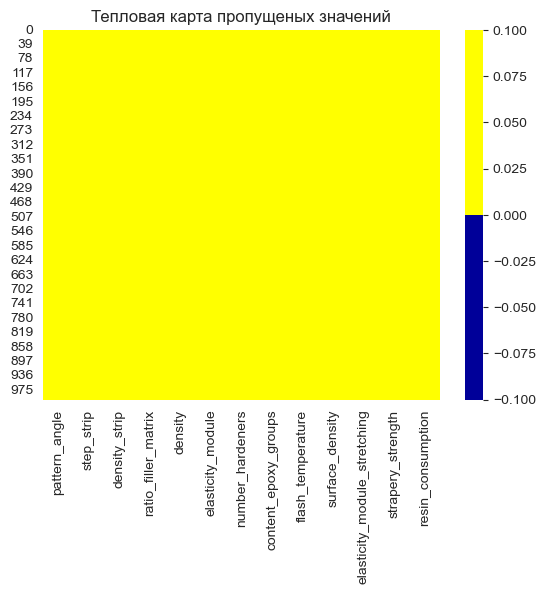

In [39]:
# Еще один метод определения пропущенных значений - Тепловая карта пропущеных значений sns.heatmap
# определяем цвета: желтый - непропущенные данные, синий - пропущенные
colours = ['#000099', '#ffff00']
ax = plt.axes()
sns.heatmap(df_le.isnull(), ax = ax, cmap=sns.color_palette(colours))
ax.set_title('Тепловая карта пропущеных значений')
plt.savefig(r'save_fig\fig_block1_clean\heatmap_df_le.png', dpi=100)
plt.show()

Мы определили, что в нашем DataFrame df_le нет  пропущенных значений и отсутствующих значений (NaN)

In [40]:
# Проверим датасет на  наличие дубликатов строк в данных
df_le.duplicated().sum()

0

В нашем dataFrame df_le НЕТ дубликатов

In [41]:
# подсчет уникальных значеий по каждому признаку
df_le.apply(lambda x: x.nunique())

pattern_angle                      2
step_strip                      1000
density_strip                   1000
ratio_filler_matrix             1000
density                         1000
elasticity_module               1000
number_hardeners                1000
content_epoxy_groups            1000
flash_temperature                999
surface_density                 1000
elasticity_module_stretching    1000
strapery_strength               1000
resin_consumption                999
dtype: int64

In [42]:
# Получим среднее и медианное значения данных в колонках
mean_and_50 = df_le.describe()
mean_and_50.loc[['mean', '50%']]

,pattern_angle,step_strip,density_strip,ratio_filler_matrix,density,elasticity_module,number_hardeners,content_epoxy_groups,flash_temperature,surface_density,elasticity_module_stretching,strapery_strength,resin_consumption
mean,0.5,6.911840,57.245335,2.930612,1975.666748,739.950562,110.541115,22.243849,285.911285,483.024658,73.328453,2467.184326,218.386871
50%,0.5,6.913444,57.413593,2.907832,1977.574341,741.148102,110.162666,22.230762,285.853958,452.972260,73.247593,2461.249268,217.277008


Среднее и медианное значения по всем признакам близки друг к другу

# Графическая часть статистического анализа

In [ ]:
# Построим гистограммы наших параметров

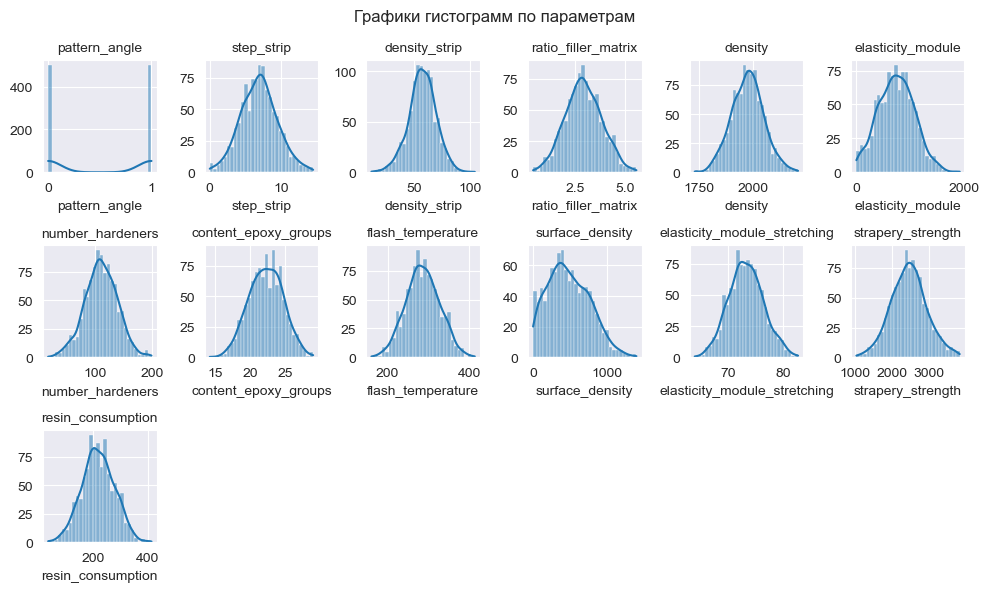

In [45]:
drawing_graphs(df_le, 3, 6, 10, 6, None, 'histplot',
               'Графики гистограмм по параметрам', 
               graf_name_path = r'save_fig\fig_block1_clean\graf_hist_df_le.png')

Кроме pattern_angle "Угол нашивки, град" и 'surface_density' "Поверхностная плотность, г/м2" остальные переменные в основном соответствуют нормальному распределению.

Данные гистограммы параметра 'surface_density' - 'Пооверхнгостная плотность' показывают четко выраженную асимметрию.
Измерение асимметрии
Используется для определения того, являются ли данные симметричными или искаженными. 
Если индекс находится между -1 и 1, то распределение является симметричным. 
Если индекс не больше -1, то он смещен влево, а если он равен как минимум 1, то он смещен вправо
Большое количество значений параметра имеют показатели близкие к 0, что также указывает на предобработку данных.
Хвост гисторграммы с правой стороны намного длиннее, чем с левой, 
и поэтому мы говорим, что асимметрия данного параметра - положительная. 
Мы можем оценить асимметрию данных количественно при помощи функции библиотеки pandas skew:

In [46]:
# подсчитаем ассиметрию нашего парамтера 'surface_density'  методом skew()
df_le['surface_density'].skew()

0.37890035

Асимметрия в параметре surface_density может быть эффективным образом смягчена 
путем взятия логарифма веса при помощи функции библиотеки numpy  - np.log
Уберем ассиметрию в 'surface_density'с помощью (np.log) предварительно создав новый df: df_log_sd 

In [47]:
df_log_sd = df_le.copy()

In [48]:
df_log_sd['surface_density'] = np.log(df_log_sd['surface_density'])

                SKEW ДО =  0.37890035            SKEW ПОСЛЕ =  -2.0575578


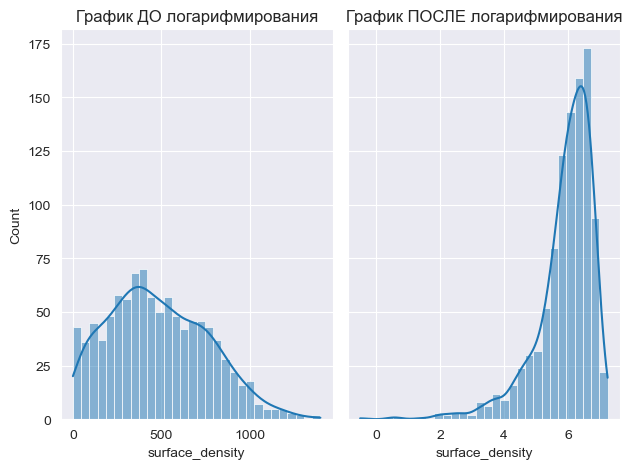

In [49]:
# Выведем гистаграммы 'surface_density' - ДО df_le и ПОСЛЕ df_log_sd
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True) # shareY=True -размерность по оси Y одинаковая
print(' ' * 15,'SKEW ДО = ', df_le['surface_density'].skew(), ' ' * 10, 'SKEW ПОСЛЕ = ', df_log_sd['surface_density'].skew())

# ax1
ax1.set_title('График ДО логарифмирования')
sns.histplot(df_le['surface_density'], ax = ax1, bins = 30,kde = True)

# ax2
sns.histplot(df_log_sd['surface_density'], ax = ax2, bins = 30, kde = True)
ax2.set_title('График ПОСЛЕ логарифмирования')

plt.tight_layout() # название осей не будут наезжать на соседние графики
plt.savefig(r'save_fig\fig_block1_clean\graf_hist_df_log_sd.png', dpi=100)
plt.show()

In [ ]:
# гистограмма 'surface_density' сместилась вправо и стала отрицательной,но мы ушли от значений 0!

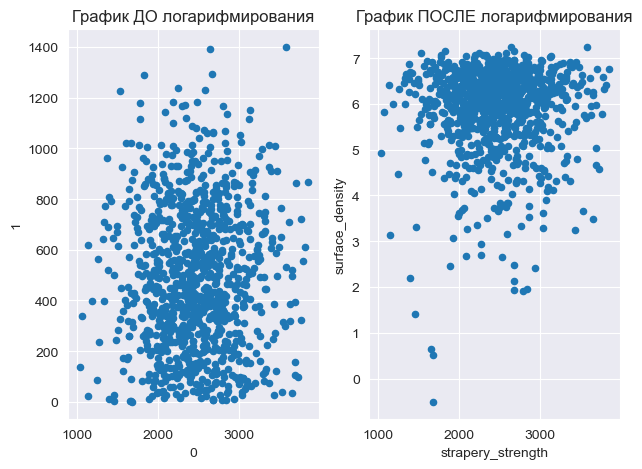

In [50]:
# проверим на точечном графике как повлияло логарифмирование параметра 'surface_density'
# на взаимоотношени с одним из целевых парметров ВКР 'strapery_strength'

f, (ax1, ax2) = plt.subplots(1, 2) #, sharey=True)

# ax1
ax1.set_title('График ДО логарифмирования')
x1 = df_le['strapery_strength']
y1 = df_le['surface_density'] # df - до логарифмирования
pd.DataFrame(np.array([x1,y1]).T).plot.scatter(0, 1, ax = ax1) 
plt.xlabel('strapery_strength')
plt.ylabel('surface_density')

# ax2
ax2.set_title('График ПОСЛЕ логарифмирования')
x2 = df_log_sd['strapery_strength']
y2 = df_log_sd['surface_density'] # df - ПОСЛЕ логарифмирования
pd.DataFrame(np.array([x2,y2]).T).plot.scatter(0, 1, ax = ax2)
plt.xlabel('strapery_strength')
plt.ylabel('surface_density')

plt.tight_layout() # название осей не будут наезжать на соседние графики
plt.savefig(r'save_fig\fig_block1_clean\graf_scatter_df_log_sd.png', dpi=100)
plt.show()

Вывод:
1. мы добились нормального распределения в гистограмме по парметру 'surface_density'
2. мы ушли от значений близких к 0, как не имеющие физического смысла!

In [ ]:
# Конец истории с логарифмом по парметру 'surface_density' 

## Построим матричный график зависимости парамтеров друг от друга
## Рассмотрим  графическое распределение значений между параметрами 

In [71]:
# Создадим новый df df_main для дальнейшего графического анализа используя df-  df_le
df_main = df_le.copy()

In [52]:
# Посмотрим как ведут себя параметры в разных концах массива
# вызываем функцию sns_plt_PairGrid из модуля modules_def

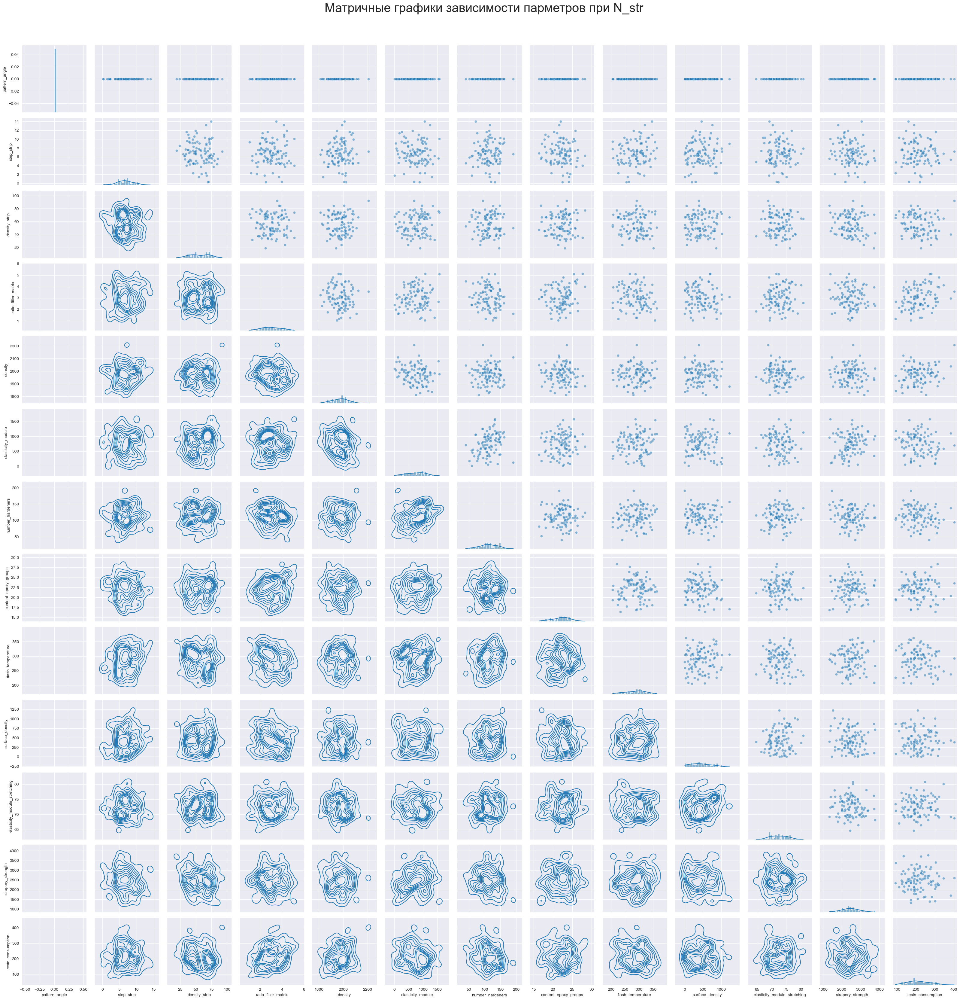

In [53]:
# Для df_main.head(100) т.е. для pattern_angle = 0 градусов
sns_plt_PairGrid(df_main, 'Матричные графики зависимости парметров при N_str', 'head', N_str=100)
plt.savefig(r'save_fig\fig_block1_clean\graf_matrix_df_main_head_N_100.png', dpi=100)

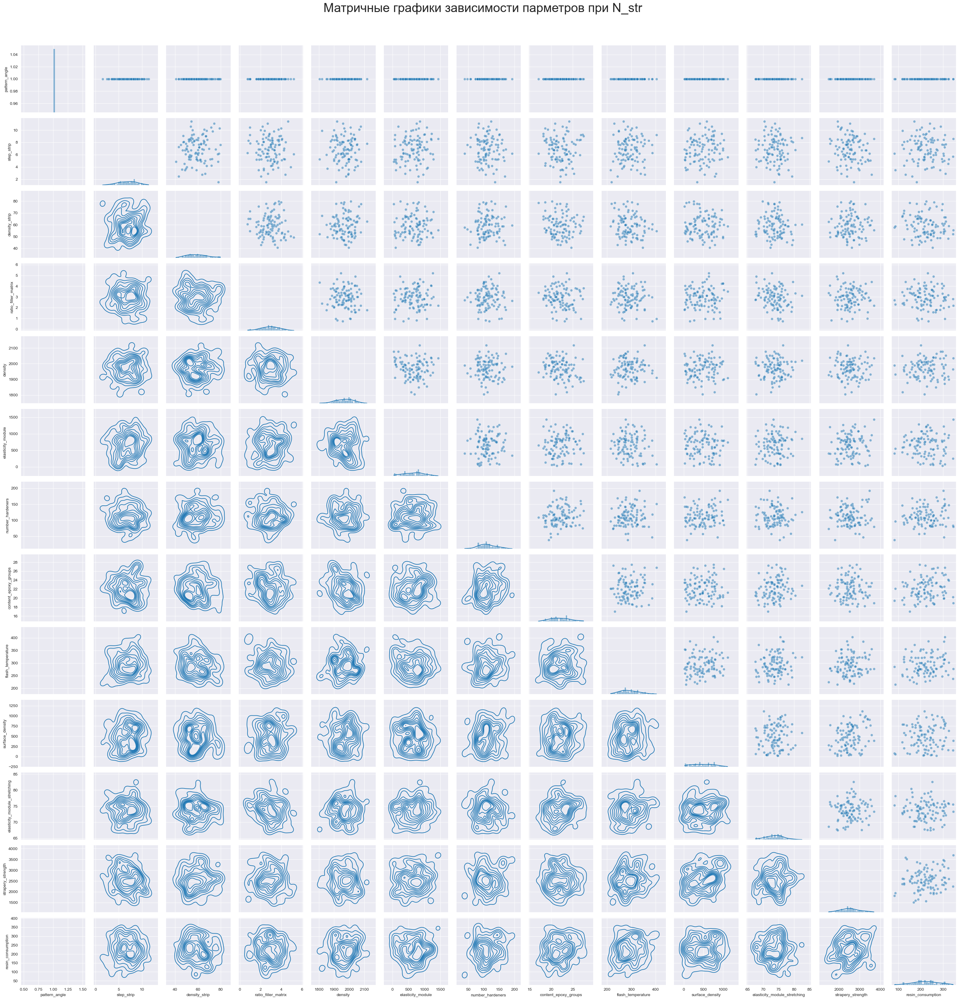

In [54]:
# Для df_main.tail(100) т.е. для pattern_angle = 1 для 90 градусов
sns_plt_PairGrid(df_main, 'Матричные графики зависимости парметров при N_str','tail', N_str=100)
plt.savefig(r'save_fig\fig_block1_clean\graf_matrix_df_main_tail_N_100.png', dpi=100)

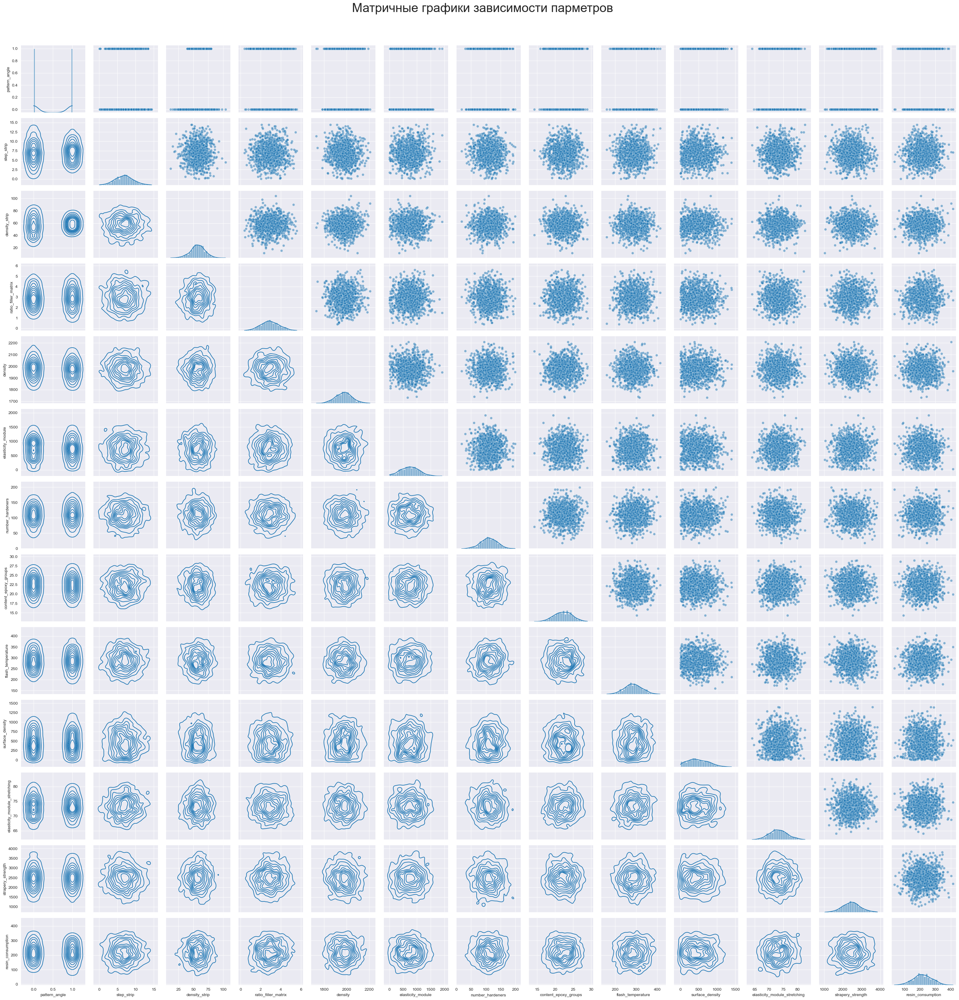

In [55]:
# Для df_main т.е. для полного df
sns_plt_PairGrid(df_main, 'Матричные графики зависимости парметров', 'None', 'None')
plt.savefig(r'save_fig\fig_block1_clean\graf_matrix_df_main_full.png', dpi=100)

Как видно из точечных графиков для всего масива - у нас не наблюдается никакой корреляции между параметрами.
Однако для начальных данных ,что в голове ,что в конце массива (для разных значений Угла нашивки) ВОЗМОЖНО есть слабая корреляция.
Проверим это в других Блоках нашего исследования.

# Проведем более глубокие исследования числовых значений

In [56]:
# Функция  оценку интервалов значений по параметрам
def column_value_counts(df):
    for column in df.columns:
        print('столбец : ', column)
        print('Интервал значений', '  ', 'Количество в интервале')
        print(df[column].value_counts(bins=50))
        print('-----------------------------')
    return

In [64]:
column_value_counts(df_main)

столбец :  pattern_angle
Интервал значений    Количество в интервале
(-0.002, 0.02]    500
(0.98, 1.0]       500
(0.04, 0.06]        0
(0.06, 0.08]        0
(0.56, 0.58]        0
(0.58, 0.6]         0
(0.6, 0.62]         0
(0.62, 0.64]        0
(0.64, 0.66]        0
(0.66, 0.68]        0
(0.68, 0.7]         0
(0.7, 0.72]         0
(0.72, 0.74]        0
(0.74, 0.76]        0
(0.76, 0.78]        0
(0.78, 0.8]         0
(0.8, 0.82]         0
(0.82, 0.84]        0
(0.84, 0.86]        0
(0.86, 0.88]        0
(0.88, 0.9]         0
(0.9, 0.92]         0
(0.92, 0.94]        0
(0.94, 0.96]        0
(0.96, 0.98]        0
(0.54, 0.56]        0
(0.52, 0.54]        0
(0.02, 0.04]        0
(0.26, 0.28]        0
(0.08, 0.1]         0
(0.1, 0.12]         0
(0.12, 0.14]        0
(0.14, 0.16]        0
(0.16, 0.18]        0
(0.18, 0.2]         0
(0.2, 0.22]         0
(0.22, 0.24]        0
(0.24, 0.26]        0
(0.28, 0.3]         0
(0.48, 0.5]         0
(0.3, 0.32]         0
(0.32, 0.34]        0
(0.34, 

In [58]:
# Создадим DataFrame  df_min_max который содержит ЭКСПЕРТНЫЕ мин и мах значения по каждому столбу в качестве критерия отбрасывания строк 
# min - индекс сроки 0 и max- индекс строки 1 получены оценочным путем при исследовании гистограмм по каждому параметру-столбцу
# Для столбца 'pattern_angle'диапазон будет :[0, 1],

df_min_max = pd.DataFrame({
                   'pattern_angle':[0, 1],
                      'step_strip':[1.5, 13.5],
                  'density_strip' :[29.0, 85.6],
             'ratio_filler_matrix':[0.5, 6.0],
                        'density' :[1780.0, 2159.0],
              'elasticity_module' :[50.0, 1560.0],
                'number_hardeners':[30.0, 190.0],     
            'content_epoxy_groups':[16.0, 28.0],
               'flash_temperature':[180.0, 394.0],
                'surface_density' :[28.5, 1200.0],
    'elasticity_module_stretching':[66.0, 81.0],
              'strapery_strength' :[1326.0, 3600.0],
               'resin_consumption':[80.0, 350.0],
                          }) 

df_min_max

,pattern_angle,step_strip,density_strip,ratio_filler_matrix,density,elasticity_module,number_hardeners,content_epoxy_groups,flash_temperature,surface_density,elasticity_module_stretching,strapery_strength,resin_consumption
0,0,1.5,29.0,0.5,1780.0,50.0,30.0,16.0,180.0,28.5,66.0,1326.0,80.0
1,1,13.5,85.6,6.0,2159.0,1560.0,190.0,28.0,394.0,1200.0,81.0,3600.0,350.0


In [72]:
# Функция  очистки выбросов - подозрительных значений СЛЕВА
# фукция заменяет подозрительные значения на экспертные минимальные  значения
# Передаваемые аргументы:
# df - исследуемый df
# df_min_max - df - полученный из функции  по оценке интервалов значений по параметрам column_value_counts:

def clean_df_left(df, df_min_max):
    sum_n_quantity = 0 # Общее количество подозрительных строк в df

    for column in df.columns:
       
        n_col = column
        print('столбец : ', n_col)
        #print('экспертное минимально-допустимое значение :', df_min_max.loc[0, n_col])
    
        n_quantity = 0 # Количество подозрительных строк в столбце
       
        for i in range(len(df)):
            if df.loc[i, n_col] < df_min_max.loc[0, n_col]:
                n_quantity =  n_quantity + 1
                #print('строка N:', i)
                #print('старое значение :', df.loc[i, n_col])
                
  # Функция 'mean_round_point' расчета СРЕДНЕГО значения для "подозрительного элемента" в столбце с разбросом '5'
                df.at[i, n_col] = mean_round_point(df, n_col, i, 5) 
                
        print('Количество подозрительных строк в столбце = ', n_quantity)
        print('---------------------------------')
        sum_n_quantity = sum_n_quantity + n_quantity
    print('Общее количество подозрительных строк в df = ', sum_n_quantity)
    return(df)

In [73]:
df_main = clean_df_left(df_main, df_min_max)

столбец :  pattern_angle
Количество подозрительных строк в столбце =  0
---------------------------------
столбец :  step_strip
Количество подозрительных строк в столбце =  17
---------------------------------
столбец :  density_strip
Количество подозрительных строк в столбце =  20
---------------------------------
столбец :  ratio_filler_matrix
Количество подозрительных строк в столбце =  2
---------------------------------
столбец :  density
Количество подозрительных строк в столбце =  2
---------------------------------
столбец :  elasticity_module
Количество подозрительных строк в столбце =  14
---------------------------------
столбец :  number_hardeners
Количество подозрительных строк в столбце =  2
---------------------------------
столбец :  content_epoxy_groups
Количество подозрительных строк в столбце =  3
---------------------------------
столбец :  flash_temperature
Количество подозрительных строк в столбце =  4
---------------------------------
столбец :  surface_density
К

всего замена подозрительных значений слева произведена в 111 строках

In [74]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 1000 non-null   int32  
 1   step_strip                    1000 non-null   float64
 2   density_strip                 1000 non-null   float64
 3   ratio_filler_matrix           1000 non-null   float64
 4   density                       1000 non-null   float64
 5   elasticity_module             1000 non-null   float64
 6   number_hardeners              1000 non-null   float64
 7   content_epoxy_groups          1000 non-null   float64
 8   flash_temperature             1000 non-null   float64
 9   surface_density               1000 non-null   float64
 10  elasticity_module_stretching  1000 non-null   float64
 11  strapery_strength             1000 non-null   float64
 12  resin_consumption             1000 non-null   float64
dtypes: f

In [75]:
# Вызываем функцию optimize_memory_usage для уменьшения размерности переменных в файле df_main и облегчения расчетов

df_main = optimize_memory_usage(df_main, print_size=True, print_info_befor=False, print_info_after=True)

Memory usage size: before 0.0955 Mb - after 0.0497 Mb (47.9%).
--------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 1000 non-null   int32  
 1   step_strip                    1000 non-null   float32
 2   density_strip                 1000 non-null   float32
 3   ratio_filler_matrix           1000 non-null   float32
 4   density                       1000 non-null   float32
 5   elasticity_module             1000 non-null   float32
 6   number_hardeners              1000 non-null   float32
 7   content_epoxy_groups          1000 non-null   float32
 8   flash_temperature             1000 non-null   float32
 9   surface_density               1000 non-null   float32
 10  elasticity_module_stretching  1000 no

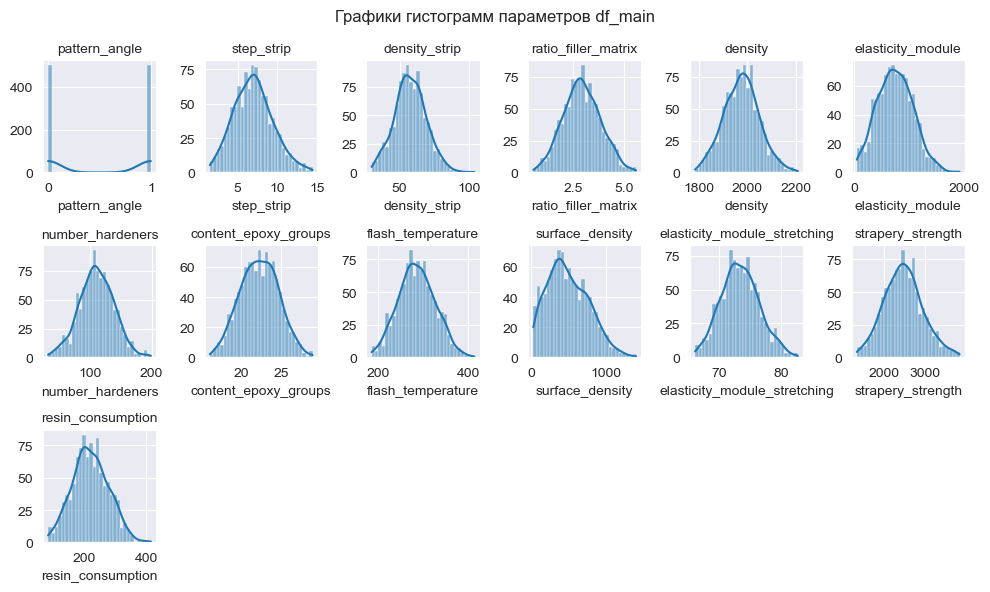

In [78]:
# Рисуеи опять графики 'гистограммы' и смотрим как  себя ведут парамтеры
drawing_graphs(df_main, 3, 6, 10, 6, None,'histplot',
               'Графики гистограмм параметров df_main', 
               graf_name_path = r'save_fig\fig_block1_clean\graf_hist_df_main.png')

In [ ]:
# Графики стали более "гаусовскими"))

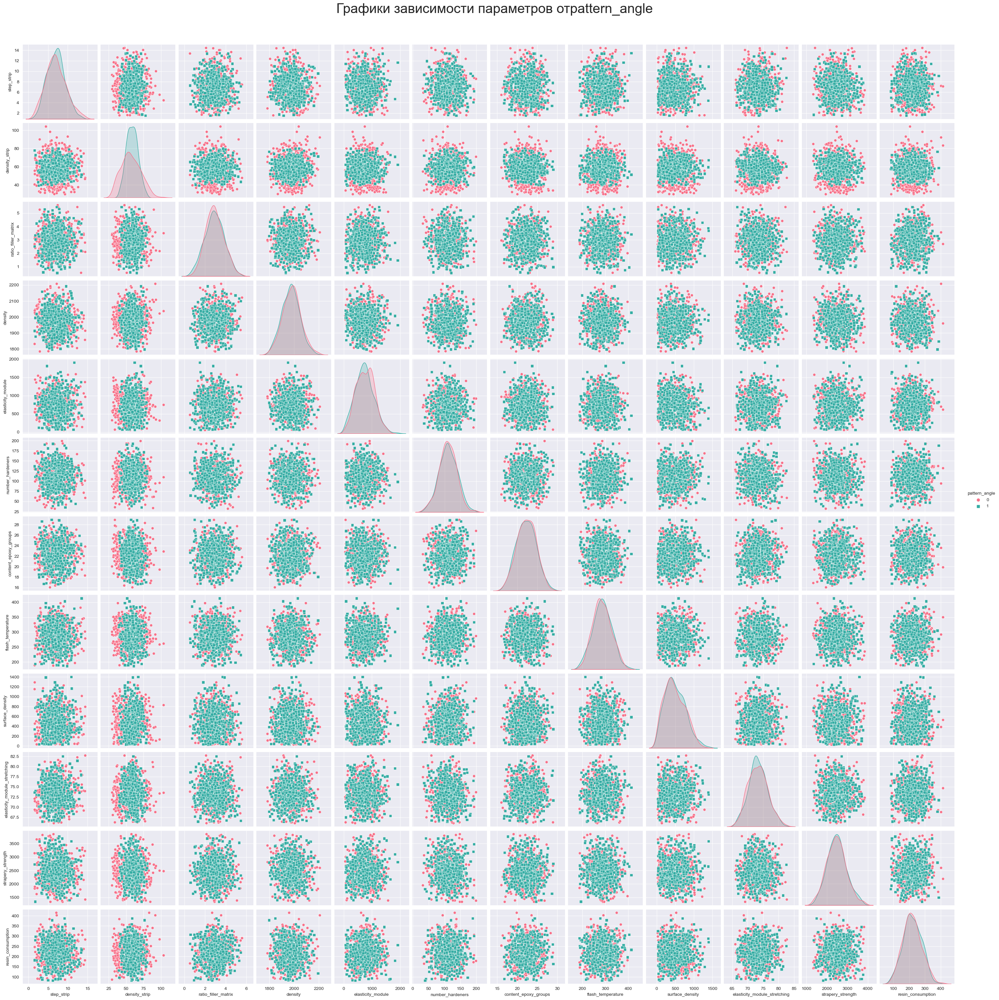

In [79]:
# Построим графики зависимости переменных друг от друга с выделением категориальной переменной 'pattern_angle'
# Возможно парамтеры зависят от нашего категориального парметра
sns.pairplot(df_main, hue = 'pattern_angle', markers = ["o", "s"], diag_kind = 'auto', palette='husl')
plt.suptitle('Графики зависимости параметров отpattern_angle',  y = 1.03, fontsize = 30)
plt.savefig(r'save_fig\fig_block1_clean\graf_matrix_pairplot_df_main_pattern_angle.png', dpi=100)

На графиках видно, что имеется некое разделение на 2 класса, хотя никакой зависимости впрямую не наблюдается.

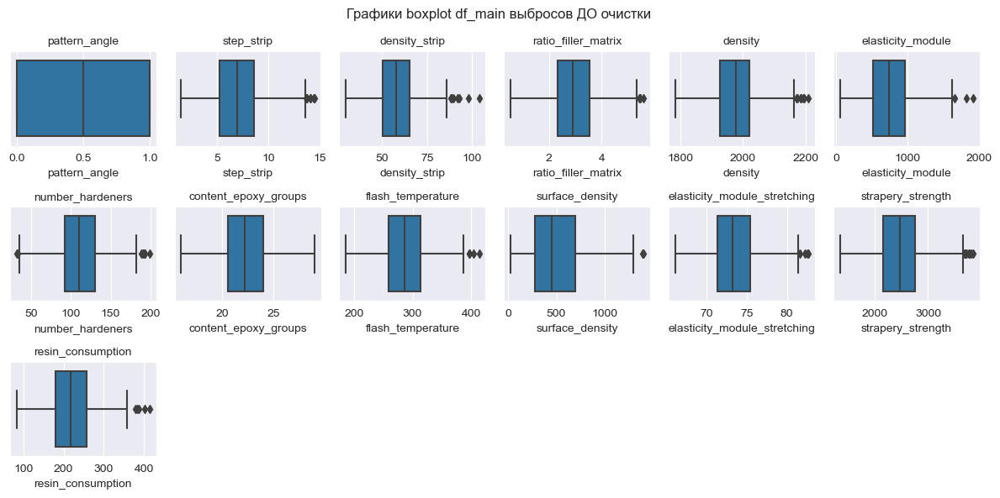

In [80]:
# Постороим графики "ящики с усам" и посмотрим есть ли выбросы
drawing_graphs(df_main, 3, 6, 12, 6,  None, 'boxplot',
               'Графики boxplot df_main выбросов ДО очистки ',
               graf_name_path = r'save_fig\fig_block1_clean\graf_boxplot_df_main_before_clean.png')

Выбросы есть и их очень много.

Проведем очистку нашег df_le (в котором 1000 строки) от выбросов

In [81]:
#1. Способ удаления выбросов IQR.
# Записшем очищеный массив df_main в df - data_clean
data_clean = outliers_IQR_delit(df_main)

Количество строк до удаления:  1000
Количество строк после удаления:  945
Удалено строк : 55


У нас было 1000 строки  до применения метода IQR. Теперь мы получили после очистки 945 строк в df -  data_clean.
Удлили 55 строк

второй способ z-с  посмотрим сколько строк уберет этот метод из  массива data_clean

In [82]:
# 2. Способ z-с посмотрим сколько строк уберет этот метод из массива data_clean
# Вызываем функцию  очистки выбросов Z_score
for column in data_clean.columns:
    Z_score(data_clean[column])
    

Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0
Total number of outliers are 0


Данный метод Z - Score НЕ нашел возможных для удаления строк!

Проведем  графический анализ имеющихся  выбросов данных в data_clean методом sns.boxplot

In [83]:
# Проверим размерность данных
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 945 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 945 non-null    int32  
 1   step_strip                    945 non-null    float32
 2   density_strip                 945 non-null    float32
 3   ratio_filler_matrix           945 non-null    float32
 4   density                       945 non-null    float32
 5   elasticity_module             945 non-null    float32
 6   number_hardeners              945 non-null    float32
 7   content_epoxy_groups          945 non-null    float32
 8   flash_temperature             945 non-null    float32
 9   surface_density               945 non-null    float32
 10  elasticity_module_stretching  945 non-null    float32
 11  strapery_strength             945 non-null    float32
 12  resin_consumption             945 non-null    float32
dtypes: fl

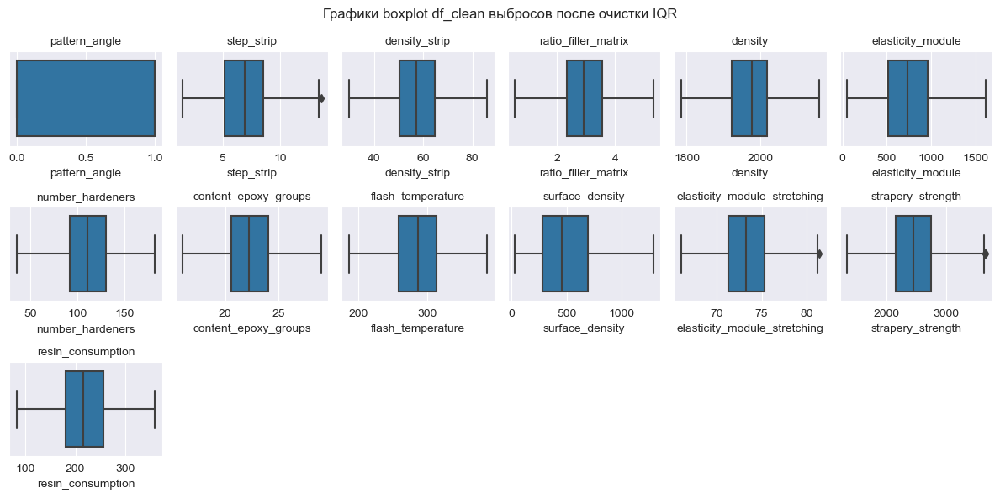

In [84]:
# Опять постороим графики "ящики с усам" и посмотрим есть ли выбросы на этот раз
drawing_graphs(data_clean, 3, 6, 12, 6, None, 'boxplot',
               'Графики boxplot df_clean выбросов после очистки IQR', 
               graf_name_path = r'save_fig\fig_block1_clean\graf_boxplot_data_clean_IQR.png')

У нас в 3-х столбцах наблюаются выбросы после замены 'подозрительных значений' функцией 'mean_round_point'  на средние значения +/- 5 значений в столбце и очистки стандартными методами IQR и Z-C.
Проведем дополнительную очистку  в столбцах: 'step_strip', 'elasticity_module_stretching' и 'strapery_strength'.
Используем функцию "Методом подбора коэффициентов в df_min_max" и удалением этих выбросов в df.

Проведем иттерацию по удалению строк из нашего df со значениями в df_min_max  при max- строка '1'.

Проведем очистку СПРАВА каждого парметра от значений  'max' лежащих дальше чем 3 СИГМА в столбцах :
'step_strip', 'elasticity_module_stretching' и 'strapery_strength'.

In [85]:
# Функция очистки значений выбросов в столбцах СПРАВА в зависимоти от экспертных МАХ значений в df_min_max
# пердаваемые параметры:
# df - наш массив
# df_min_max - массив экпертных крайних сначений для каждого столбца
# df_name_column - массив наименований столбцов, в которых необходимо провести очистку СПРАВА

def clean_column_rigth(df, df_min_max, df_name_column):
    sum_del_rigth = 0 # Количество строк удаленных выбросов СПРАВА после определения столбцов с выбросами в boxplot
   
    for name_col in df_name_column.columns:
        for column in df.columns:
            if column != name_col:
                continue
            l_begin = len(df)
            df = df[(df[column] < df_min_max.loc[1, column])]     
            l_end = len(df)
            list_x = l_begin - l_end
            print(df.shape)
            print('Количество подозрительных строк в столбце = ', list_x)
            print('---------------------------------')
        sum_del_rigth = sum_del_rigth + list_x
    print('Общее количество удалнных подозрительных строк из-за выбросов СПРАВА в df = ', sum_del_rigth)
    
    return(df)

In [86]:
# Создадим список столбцов и df, где есть выбросы СПРАВА для передачи в  функцию clean_column_rigth
list_name_column = ['step_strip', 'elasticity_module_stretching', 'strapery_strength']
df_name_column = pd.DataFrame(columns=list_name_column)

In [87]:
# Очистка df data_clean от выбросов СПРАВА
data_clean = clean_column_rigth(data_clean, df_min_max, df_name_column)
data_clean.shape

(944, 13)
Количество подозрительных строк в столбце =  1
---------------------------------
(941, 13)
Количество подозрительных строк в столбце =  3
---------------------------------
(935, 13)
Количество подозрительных строк в столбце =  6
---------------------------------
Общее количество удалнных подозрительных строк из-за выбросов СПРАВА в df =  10


(935, 13)

На данной иттерации мы удалили еще 10 строк с выбросами. у нас осталось 945 - 10 = 935 строк

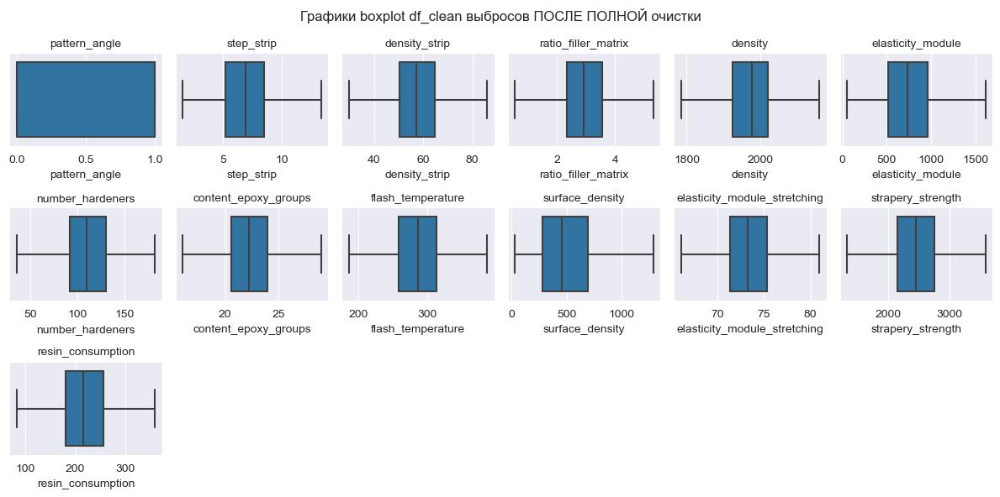

In [88]:
# После проведения 3-й иттерации по очистке данных проверим наличие выбросов опять
drawing_graphs(data_clean, 3, 6, 12, 6, None, 'boxplot', 
               'Графики boxplot df_clean выбросов ПОСЛЕ ПОЛНОЙ очистки', 
               graf_name_path = r'save_fig\fig_block1_clean\graf_boxplot_data_clean_full.png')

# У нас получились "чистые ", без выброов "ящики с усами"!

In [89]:
print('Количество строк до очистки df: ', len(df_le))
print('Количество строк после очистки: ', len(data_clean))
print('Удалено строк :', (len(df_le) - len(data_clean)))
total_del_percent = ((len(df_le) - len(data_clean)) / len(df_le)) * 100
print('Удалено : ', total_del_percent, '%')

Количество строк до очистки df:  1000
Количество строк после очистки:  935
Удалено строк : 65
Удалено :  6.5 %


В начальном DF  у нас было 1000 строк, сейчас осталось 935 строк. Всего удалили  65 строк или 6.5 %.

In [90]:
data_clean.apply(lambda x: x.nunique())

pattern_angle                     2
step_strip                      935
density_strip                   935
ratio_filler_matrix             935
density                         935
elasticity_module               935
number_hardeners                935
content_epoxy_groups            935
flash_temperature               934
surface_density                 935
elasticity_module_stretching    935
strapery_strength               935
resin_consumption               935
dtype: int64

In [91]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 935 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pattern_angle                 935 non-null    int32  
 1   step_strip                    935 non-null    float32
 2   density_strip                 935 non-null    float32
 3   ratio_filler_matrix           935 non-null    float32
 4   density                       935 non-null    float32
 5   elasticity_module             935 non-null    float32
 6   number_hardeners              935 non-null    float32
 7   content_epoxy_groups          935 non-null    float32
 8   flash_temperature             935 non-null    float32
 9   surface_density               935 non-null    float32
 10  elasticity_module_stretching  935 non-null    float32
 11  strapery_strength             935 non-null    float32
 12  resin_consumption             935 non-null    float32
dtypes: fl

# C массивом с конечным названием data_clean мы провели следующие исследования:
1. В df_nup в диапазоне от 0 до 40 строки наблюдается явная детерменированность показателей, что свидетельствует об искусственном искажении DF. Удалим первые 40 строк из df_nup как явно искаженные, оставив 1040 - 40  = 1000 строк.
2. В df_bp в диапазоне от 0 до  23 строк наблюдается явная детерменированность показателей, что также свидетельствует об искусственном искажении df_bp. В df_bp отборсили начальные 23 стоки, оставивили 1023 - 23 = 1000. Размерность наших массивов будет одинакова и их можно было объединять.
3. Объединили df_nup.drop и df_bp-drop методом INNER в один датафрейм.
4. Все признаки являются числовыми.
5. Исходный dataset не содержит пропущенных данных и дубликатов строк.
6. Все признаки за исключением "Угол нашивки, град" имеют много уникальных данных.
7. Проверили возможность логарифмирования параметра имеющего искаженную гистограмму. Это не дало результатов.
8. Провели большой графический анализ матричными графиками на первоначальных, конечных,  средних  и полном объемах данных. Выидимх зависимостей на графиках не обнаружено.
9. Все признаки за исключением "Угол нашивки, град" имеют выбросы.
10. Провели очистку выбросов методом IQR  и удалили еще 55 строк.
11. Провели очистку выбросов методом Z_Score. Метод не нашел дополнительные выбросы.
12. Провели графический аналих по boxpot,  мы убедились что в ряде столбцов остались выбросы. Чтобы убрать оставшиеся выбросы, мы в ручном режиме  на основе экспертных оценок пороговых значений для каждого парамтера  убрали по шаблону df_min_max значния подозрительных значений СЛЕВА и СПРАВА меньше МИН и больше МАХ, всего 10 строк.
13. Всего мы удалили 1000 - 935 = 65 строк  или 6.5 % из укороченного исходного файла.
14. Запишим data_clean в новый файл 'data_main_clean.csv' для дальнейшей работы и изучения методами sklearn.

15. Считаем, что df - data_clean очищен от выбросов и с ним можно проводить исследования на регрессию.

In [ ]:
Выводы к разделу 1
Исходный dataset состоит из 1023 строк и включает в себя 13 признаков из которых два являются целевыми.
Все признаки являются числовыми.
Исходный dataset не содержит пропущенных данных и дубликатов строк.
Все признаки за исключением "Угол нашивки, град" имеют много уникальных данных
Признак "Угол нашивки, град" имеет два значения: 0 и 90. 
Возможно потребуется этот признак перевести в категориальный признак.
Все признаки за исключением "Угол нашивки, град" имели выбросы. 
Из матричных графиков параметров следуеи ,что  признаки очень слабокоррелированы как между собой.

In [ ]:
data_clean.to_csv(r'data_storage\data_block1_clean\data_main_clean.csv', index=False)

In [ ]:
# Конец блока № 1 Создание и очистка df